# FIFA 20 Dataset Analysis

### Table of content
- Introduction
- Data Wrangling
- Data Preprocessing
    - Data Cleanning.
    - Feature Engineering.
- Data Exploratory 
    - Univariate Exploration.
    - Bivariate Exploration.
    - Multivariate Exploration.
- Hypothesis Test
- Models
    - Classification Model by Dession Tree.
    - KNN Cluster Model.
    - Support Vector Machine( SVM) Model.
    - Random Forest Classifier( RFC) Model
- Conclusions


#### Our Aim 
- Present a brief data analysis for some features in FIFA 2020.
- Building model that Classifying playes based on Premier League Clubs.

## Introduction

- The dataset includes the players data for the Career Mode FIFA 20. Data has been scraped from the publicly available website https://sofifa.com , and  you can get this data from https://kaggle.com .
- It contains 18,278 players with 104 different attributes.
- every player in FIFA 20 has:
    - URL of the scraped player
    - Player positions, with the role in the club and in the national team
    - Player attributes with statistics as Attacking, Skills, Defense, Mentality, GK Skills, etc.
    - Player personal data like Nationality, Club, DateOfBirth, Wage, Salary, etc.

#### Questions:

We tried to make analysis for some ideas:
- Univariate Exploration
    - Distributed of some numerical attributes.
    - Count of players by age.
    - Count of players by nationality.
    - Count of players by preferred foot.
    - Count of players by BMI(Body Mass Index).
    - Players have the max values in some feature(overall ,age, potential,etc..).
    - Clubs have top 20 players with a high overall.
    - Nationality have top 20 players with a high overall.
    - Age has Max players in Top 20.
    - Proportion of Player's per Position.
    
- Bivariate Exploration
    - Does increasing of overall rating depend on age?
    - Does increasing in overall depend on BMI?
    - Relation between height and weight.
    - Relation between weight and pace.
    
- Multivariate Exploration
    - Relation between Overall Rating , Value  in Euros  and Age.
    - Relation between overall , potential and age.
    - Correlation between features.
    - Comparison between (MESSI VS RONALDO).
    - Comparison between (M.Salah VS RONALDO).
    - Comparison between (MESSI VS M.Salah).

## Load the packages

In [1]:
#import packages

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from math import pi
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Load the data
df=pd.read_csv("players_20.csv")

## Data Wrangling

In [3]:
#show information for data
df.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18278 entries, 0 to 18277
Columns: 104 entries, sofifa_id to rb
dtypes: float64(16), int64(45), object(43)
memory usage: 14.5+ MB


In [4]:
df.dtypes

sofifa_id      int64
player_url    object
short_name    object
long_name     object
age            int64
               ...  
lb            object
lcb           object
cb            object
rcb           object
rb            object
Length: 104, dtype: object

Show the dimention of dataset

In [5]:
df.shape

(18278, 104)

### Describe statistic for data

In [6]:
df.describe()

,sofifa_id,age,height_cm,weight_kg,overall,potential,value_eur,wage_eur,international_reputation,weak_foot,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,1.827800e+04,18278.000000,18278.000000,18278.000000,...,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000,18278.000000
mean,219738.864482,25.283291,181.362184,75.276343,66.244994,71.546887,2.484038e+06,9456.942773,1.103184,2.944250,...,48.383357,58.528778,46.848889,47.640333,45.606631,16.572765,16.354853,16.212934,16.368038,16.709924
std,27960.200461,4.656964,6.756961,7.047744,6.949953,6.139669,5.585481e+06,21351.714095,0.378861,0.664656,...,15.708099,11.880840,20.091287,21.585641,21.217734,17.738069,16.996925,16.613665,17.136497,18.038125
min,768.000000,16.000000,156.000000,50.000000,48.000000,49.000000,0.000000e+00,0.000000,1.000000,1.000000,...,7.000000,12.000000,1.000000,5.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,204445.500000,22.000000,177.000000,70.000000,62.000000,67.000000,3.250000e+05,1000.000000,1.000000,3.000000,...,39.000000,51.000000,29.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,226165.000000,25.000000,181.000000,75.000000,66.000000,71.000000,7.000000e+05,3000.000000,1.000000,3.000000,...,49.000000,60.000000,52.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,240795.750000,29.000000,186.000000,80.000000,71.000000,75.000000,2.100000e+06,8000.000000,1.000000,3.000000,...,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,252905.000000,42.000000,205.000000,110.000000,94.000000,95.000000,1.055000e+08,565000.000000,5.000000,5.000000,...,92.000000,96.000000,94.000000,92.000000,90.000000,90.000000,92.000000,93.000000,91.000000,92.000000




View top 5 and last 5 from dataset


In [7]:
df.head()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,32,1987-06-24,170,72,Argentina,FC Barcelona,...,68+2,66+2,66+2,66+2,68+2,63+2,52+2,52+2,52+2,63+2
1,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,34,1985-02-05,187,83,Portugal,Juventus,...,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3
2,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Junior,27,1992-02-05,175,68,Brazil,Paris Saint-Germain,...,66+3,61+3,61+3,61+3,66+3,61+3,46+3,46+3,46+3,61+3
3,200389,https://sofifa.com/player/200389/jan-oblak/20/...,J. Oblak,Jan Oblak,26,1993-01-07,188,87,Slovenia,Atlético Madrid,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,183277,https://sofifa.com/player/183277/eden-hazard/2...,E. Hazard,Eden Hazard,28,1991-01-07,175,74,Belgium,Real Madrid,...,66+3,63+3,63+3,63+3,66+3,61+3,49+3,49+3,49+3,61+3


In [8]:
df.tail()

,sofifa_id,player_url,short_name,long_name,age,dob,height_cm,weight_kg,nationality,club,...,lwb,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb
18273,245006,https://sofifa.com/player/245006/shuai-shao/20...,Shao Shuai,邵帅,22,1997-03-10,186,79,China PR,Beijing Renhe FC,...,43+2,42+2,42+2,42+2,43+2,45+2,46+2,46+2,46+2,45+2
18274,250995,https://sofifa.com/player/250995/mingjie-xiao/...,Xiao Mingjie,Mingjie Xiao,22,1997-01-01,177,66,China PR,Shanghai SIPG FC,...,44+2,43+2,43+2,43+2,44+2,46+2,47+2,47+2,47+2,46+2
18275,252332,https://sofifa.com/player/252332/wei-zhang/20/...,Zhang Wei,张威,19,2000-05-16,186,75,China PR,Hebei China Fortune FC,...,47+2,49+2,49+2,49+2,47+2,47+2,49+2,49+2,49+2,47+2
18276,251110,https://sofifa.com/player/251110/haijian-wang/...,Wang Haijian,汪海健,18,2000-08-02,185,74,China PR,Shanghai Greenland Shenhua FC,...,48+2,48+2,48+2,48+2,48+2,48+2,49+2,49+2,49+2,48+2
18277,233449,https://sofifa.com/player/233449/ximing-pan/20...,Pan Ximing,潘喜明,26,1993-01-11,182,78,China PR,Hebei China Fortune FC,...,48+2,49+2,49+2,49+2,48+2,48+2,50+2,50+2,50+2,48+2


#### Attributes of dataset

In [9]:
df.columns

Index(['sofifa_id', 'player_url', 'short_name', 'long_name', 'age', 'dob',
       'height_cm', 'weight_kg', 'nationality', 'club',
       ...
       'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb', 'rcb', 'rb'],
      dtype='object', length=104)

#### Check duplicated rows

In [10]:
df.duplicated().sum()

0

In [11]:
df.nunique()

sofifa_id     18278
player_url    18278
short_name    17354
long_name     18218
age              27
              ...  
lb               96
lcb             110
cb              110
rcb             110
rb               96
Length: 104, dtype: int64

### What is the structure of your dataset?
- Dataset contains 18,278 players with 104 different attributes.

### What is/are the main feature(s) of interest in your dataset?
- short_name, age, height_cm, weight_kg, nationality, club, overall, potential, value_eur, wage_eur, player_positions, preferred_foot, international_reputation, weak_foot, skill_moves, work_rate, release_clause_eur, team_position, pace, shooting, passing, dribbling, defending, physic , attacking_crossing, attacking_finishing, skill_ball_control, movement_sprint_speed, movement_balance, power_shot_power, mentality_vision.

### What features in the dataset do you think will help support your investigation into your feature(s) of interest?
- age, nationality, club, overall, potential, value_eur, player_positions, preferred_foot, release_clause_eur, pace, weiht_kg, height_cm, shooting, passing, dribbling, defending, physic.

## Data Preprocessing

## Data Cleaning


- Drop Unused features.
- Missing Values in columns.

#### Define 
- Drop unused features from the data.


#### Code :

In [12]:
uselesscolumn = ['dob','sofifa_id','player_url','long_name','body_type','real_face','nation_position','loaned_from','nation_jersey_number', 'ls', 'st', 'rs',
       'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm', 'cm',
       'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb']
# Drop unused columns
df = df.drop(uselesscolumn,axis = 1)

#### Test :

In [13]:
df.head()

,short_name,age,height_cm,weight_kg,nationality,club,overall,potential,value_eur,wage_eur,...,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
0,L. Messi,32,170,72,Argentina,FC Barcelona,94,94,95500000,565000,...,75,96,33,37,26,6,11,15,14,8
1,Cristiano Ronaldo,34,187,83,Portugal,Juventus,93,93,58500000,405000,...,85,95,28,32,24,7,11,15,14,11
2,Neymar Jr,27,175,68,Brazil,Paris Saint-Germain,92,92,105500000,290000,...,90,94,27,26,29,9,9,15,15,11
3,J. Oblak,26,188,87,Slovenia,Atlético Madrid,91,93,77500000,125000,...,11,68,27,12,18,87,92,78,90,89
4,E. Hazard,28,175,74,Belgium,Real Madrid,91,91,90000000,470000,...,88,91,34,27,22,11,12,6,8,8


In [14]:
df.columns

Index(['short_name', 'age', 'height_cm', 'weight_kg', 'nationality', 'club',
       'overall', 'potential', 'value_eur', 'wage_eur', 'player_positions',
       'preferred_foot', 'international_reputation', 'weak_foot',
       'skill_moves', 'work_rate', 'release_clause_eur', 'player_tags',
       'team_position', 'team_jersey_number', 'joined', 'contract_valid_until',
       'pace', 'shooting', 'passing', 'dribbling', 'defending', 'physic',
       'gk_diving', 'gk_handling', 'gk_kicking', 'gk_reflexes', 'gk_speed',
       'gk_positioning', 'player_traits', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_

#### Define 
- Missing Values in columns.

#### Code :

##### Check for missing values 

In [15]:
# Check the missing values in the columns
missing_data = df.isnull().sum().sort_values(ascending=False)
missing_data = missing_data.reset_index(drop=False)
missing_data = missing_data.rename(columns={"index": "Columns", 0: "Value"})
missing_data['Proportion'] = (missing_data['Value']/len(df))*100

missing_data

,Columns,Value,Proportion
0,player_tags,16779,91.798884
1,gk_speed,16242,88.860926
2,gk_positioning,16242,88.860926
3,gk_reflexes,16242,88.860926
4,gk_kicking,16242,88.860926
...,...,...,...
64,attacking_volleys,0,0.000000
65,attacking_short_passing,0,0.000000
66,attacking_heading_accuracy,0,0.000000
67,attacking_finishing,0,0.000000


##### Plotting the percentage of missing values

In [16]:
sample = missing_data[missing_data['Proportion']>10]
fig = px.pie(sample, names='Columns', values='Proportion',
             color_discrete_sequence=px.colors.sequential.Viridis_r,
             title='Percentage of Missing values in Columns')
fig.update_traces(textposition='inside', textinfo='label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))

fig.show()

This pie chart show columns have more than 10% of missing values. Here columns related to player tags and traits & goalkeeper attributes have the highest missing values.

In [17]:
# Replace NAN in others columns with 0
df = df.fillna(0)


#### Test :

In [18]:
df.isnull().sum().sort_values(ascending=False)

goalkeeping_reflexes          0
passing                       0
team_position                 0
team_jersey_number            0
joined                        0
                             ..
attacking_volleys             0
attacking_short_passing       0
attacking_heading_accuracy    0
attacking_finishing           0
short_name                    0
Length: 69, dtype: int64

## Add New Feature

##### Body Mass Index :  
Use weight and height to calculate Body Mass Index for all players to use it in our analysis.

#### Code :

In [19]:
# Creation of a BMI feature using Weight_kg & Height_cm
df['bmi'] = df['weight_kg'] // (df['height_cm']/100)**2

## Data Exploration


Now compute statistic and create visualizations for questions:

### Questions
- Univariate Exploration
    - Distributed of some numerical attributes.
    - Count of players by age.
    - Count of players by nationality.
    - Count of players by preferred foot.
    - Count of players by BMI(Body Mass Index).
    - Players have the max values in some feature(overall ,age, potential,etc..).
    - Clubs have top 20 players with a high overall.
    - Nationality have top 10 players with a high overall.
    - Age has Max players in Top 20.
    - Proportion of Player's per Position.
    
- Bivariate Exploration
    - Does increasing of overall rating depend on age?
    - Does increasing in overall depend on BMI?
    - Relation between height and weight.
    - Relation between weight and pace.
    - Relation between height and defence.
    
- Multivariate Exploration
    - Relation between Overall Rating , Value  in Euros  and Age.
    - Relation between overall , potential and age.
    - Correlation between features.
    - Comparison between (MESSI VS RONALDO).
    - Comparison between (RONALDO VS M.Salah).
    - Comparison between (MESSI VS M.Salah).

## Univariate Exploration

### Question 1 :
##### Distributed of some numerical attributes.


#### Code :

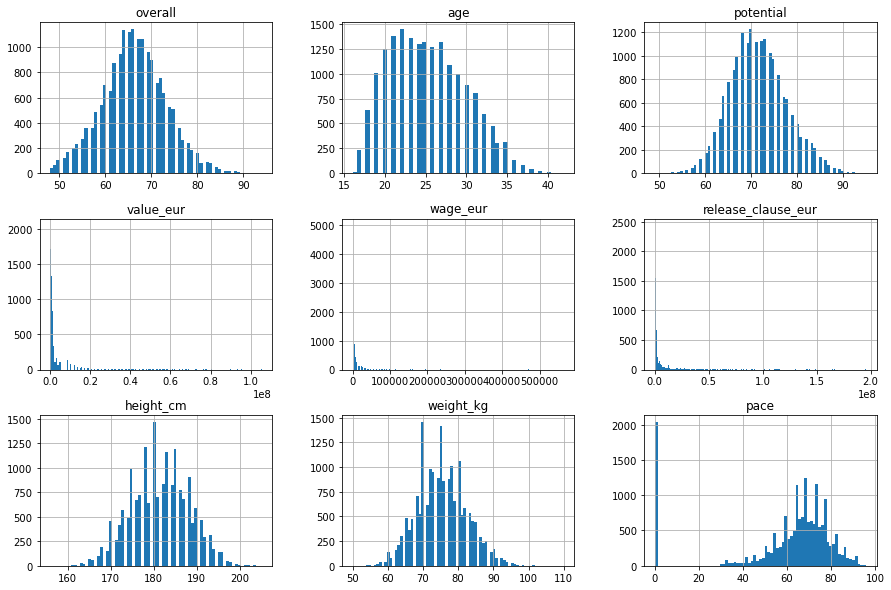

In [20]:
# Show the distribution of some numerical attributes by histogram
dist_subset = df[["overall", "age","potential",'value_eur', "wage_eur","release_clause_eur","height_cm","weight_kg", "pace"]]
dist_subset.hist(bins='auto', figsize=(15,10));

- Distributions for value & wage and release clause are highly skewed to the right.
- We can say that distribution for overall and potential is normal.
- maximum players are from the age group 20-25.

##### we can more display for the distributions by boxplot

#### Code :

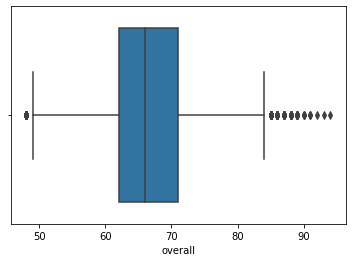

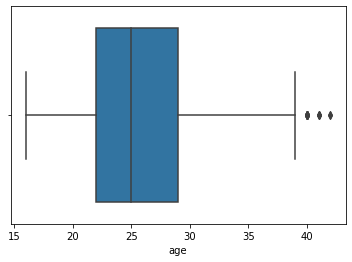

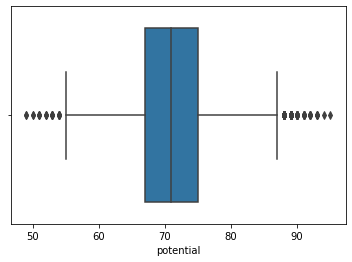

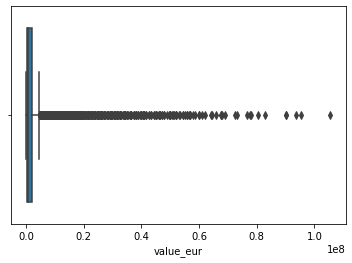

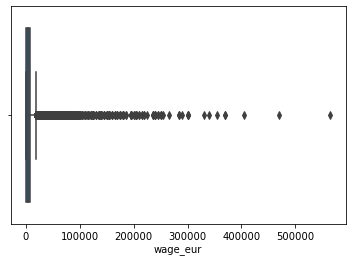

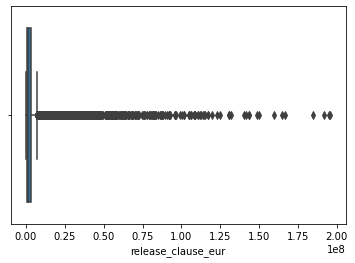

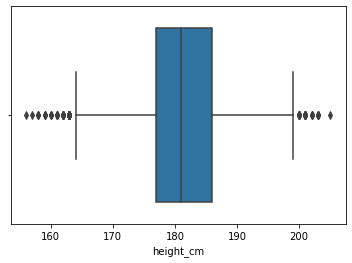

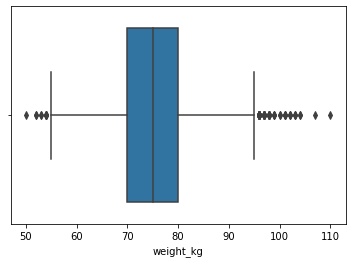

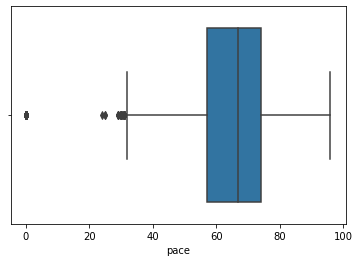

In [21]:
for col in dist_subset.columns:
    sns.boxplot(x = col, data = dist_subset) 
    plt.show()

- Boxplots display many outliers in value & wage & release clause and pace.
- Few outliers in overall & weight and height and potential.

### Question 2 :
##### Count of players by age.

#### Code :

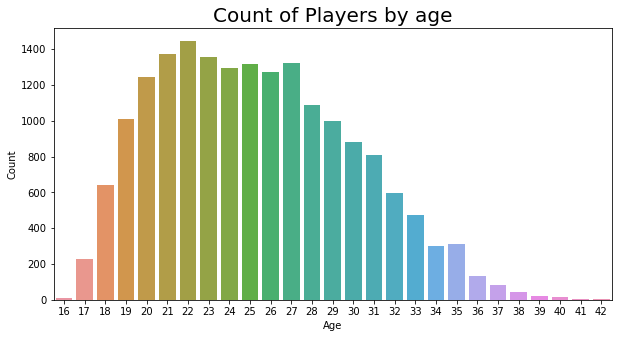

In [22]:
# Give size for graph
plt.figure(figsize= (10,5))
# USe seaborn package to plot bar graph
ax = sns.countplot(x='age', data=df)

# Edit title , x label and y label
ax.set_title(label='Count of Players by age', fontsize=20)

ax.set_xlabel(xlabel='Age')
ax.set_ylabel(ylabel='Count');

This bar graph count players by age, display that there are more players in age 22.

### Question 3 :
##### Count of players by nationality.

#### Code :

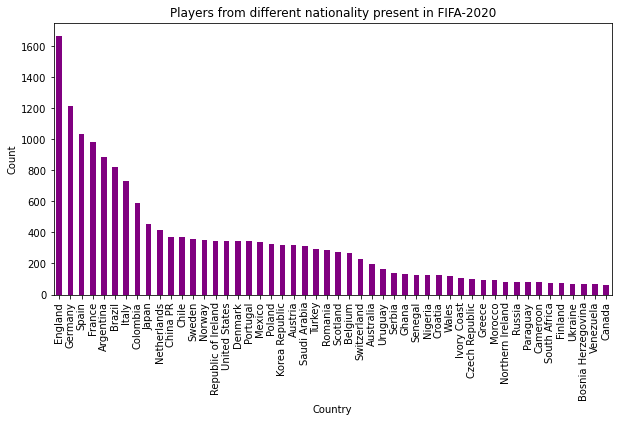

In [23]:
# Give size for graph
plt.figure(figsize = (10,5))
# plot bar graph
df['nationality'].value_counts().head(50).plot.bar(color = 'purple')

# Edit title , x label and y label
plt.title('Players from different nationality present in FIFA-2020')
plt.xlabel('Country')
plt.ylabel('Count')
plt.show()

- Bar graph for count players by nationality.
- England, Germany and Spain has the highest number of players.
- Venezuela and Slovenia have least number of players.

### Question 4 :
##### Count of players by preferred foot.

#### Code :

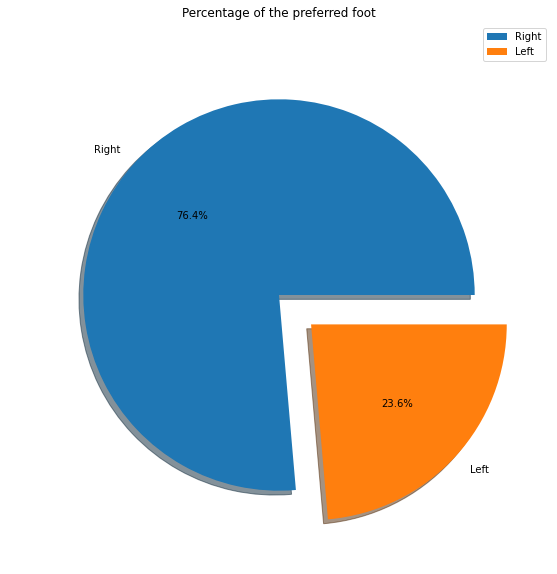

In [99]:
# plot pie chart
plt.figure(figsize= (20,10))
name =df['preferred_foot'].value_counts()
label = df['preferred_foot'].value_counts().index
explode = [0,0.2]
plt.pie(name,labels = label,shadow = True,autopct='%1.1f%%',explode =explode, radius = 0.9)
# Edit the title of graph
plt.title('Percentage of the preferred foot')
plt.legend();

Pie chart for preferred foot, we can see that percentage of the preferred foot for right foot is more than left foot in fifa 2020 dataset.

### Question 5 :
##### Count of players by BMI(Body Mass Index).

#### Code :

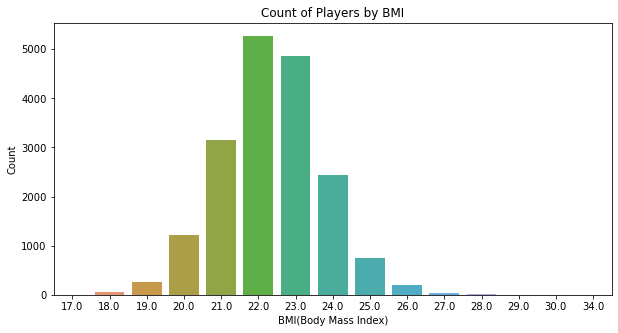

In [25]:
# Give size for graph
plt.figure(figsize= (10,5))
# Use seaborn package to plot bar graph
ax = sns.countplot(x='bmi', data=df )
# Edit title, x label and y label 
ax.set_title(label='Count of Players by BMI')
ax.set_xlabel(xlabel='BMI(Body Mass Index)')
ax.set_ylabel(ylabel='Count');

bar graph for count players by body mass index(BMI), show that body mass index(BMI) for many players is 22.more palyer in the normal weight

### Question 6 :
##### Players have the max values in some feature(overall ,age, potential, value_eur, wage_eur,etc..)

#### Code :

In [26]:
# Select some columns to make analysis
metrics = ['overall','age', 'potential', 'value_eur', 'wage_eur','release_clause_eur',
           'attacking_finishing', 'dribbling', 'mentality_vision', 
           'power_shot_power', 'mentality_penalties', 'pace', 'passing', 'defending']
# for loop to show the name of player has the max value for all seleted columns
for i in metrics:
    best_Overall = df.loc[df[i] == df[i].max(), ['short_name', i]].values.tolist()
    print('Top', i, ': ', best_Overall[0][0], '-->', best_Overall[0][1])

Top overall :  L. Messi --> 94
Top age :  C. Muñoz --> 42
Top potential :  K. Mbappé --> 95
Top value_eur :  Neymar Jr --> 105500000
Top wage_eur :  L. Messi --> 565000
Top release_clause_eur :  L. Messi --> 195800000.0
Top attacking_finishing :  L. Messi --> 95
Top dribbling :  L. Messi --> 96.0
Top mentality_vision :  L. Messi --> 94
Top power_shot_power :  Cristiano Ronaldo --> 95
Top mentality_penalties :  M. Kruse --> 92
Top pace :  K. Mbappé --> 96.0
Top passing :  L. Messi --> 92.0
Top defending :  V. van Dijk --> 90.0


- Can see that L.Messi is the most player has high overall & wage & release_clause 
  & attacking_finishing & dribbling & mentality_vision .
- Neymar Jr has high value.
- Cristiano Ronaldo has high power_shot.
- C. Muñoz is the oldest player with 42 years old.
- V. van Dijk has high defending.

###  Question 7 :
##### Clubs have top 20 players with a high overall.


#### Code :

In [27]:
# Make descending sort the data by overall
top_rated = df.sort_values(by= ["overall"], ascending= False)


In [28]:
# use plotly to plot pie chart 
fig = px.pie(top_rated.head(20), names='club', title='Percentage of Clubs in Top 20 players',color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Pie chart for clubs have top 20 players, show that FC Barcelona has more top players than other clubs and Real Madrid & Liverpool are next with percentage 15%.

### Question 8 :
##### Nationality have top 10 players with a high overall.


#### Code :

In [110]:
# use plotly to plot pie chart 
fig = px.pie(top_rated.head(20), names='nationality', title='Percentage of Country in Top 20 players',color_discrete_sequence=px.colors.sequential.RdBu)
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

Pie chart for nationality have top 20 players, show that Spain has more top players than other countries.

###  Question 9 :
##### Age has Max players in Top 20


#### Code :

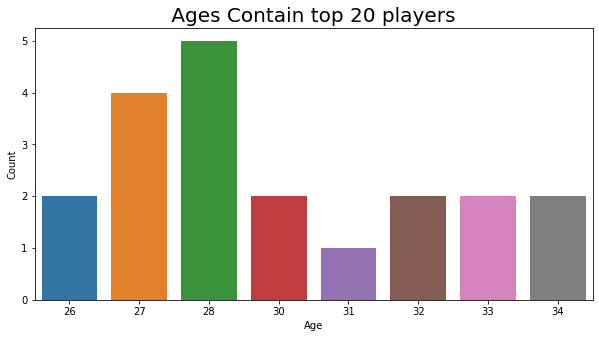

In [30]:
# Give size for graph
plt.figure(figsize=(10,5))
# Use seaborn package to plot bar graph
sns.countplot('age',data=top_rated.head(20))
# Edit title , x label , y label
plt.xlabel('Age')
plt.ylabel('Count')
plt.title(' Ages Contain top 20 players ',fontsize = 20);

Bar graph for count top 20 players by age, show that the most age of top 20 players is 28 years.

### Question 10 :
##### Proportion of Player's per Position

##### Percentage of players in Defender Role

#### Code :

In [31]:
# Select positions belong to defence
defence = ['LCB', 'RCB', 'LB', 'RB', 'CB', 'RWB', 'LWB']
sample = df.query('team_position in @defence') 

# Use plotly to plot pie chart 
fig = px.pie(sample, names='team_position',
             color_discrete_sequence=px.colors.sequential.Magma_r,  
             title='Percentage of players in Defender Role')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))

Pie chart for players in Defender Role in team position, show that RCB & LCB have more player with percentage 24.8%, 
and the next are LB & RB with percentage 21.1%.

#### Percentage of players in Midfielder Role

#### Code :

In [32]:
# Select positions belong to the midfield
mid = ['CAM', 'RCM', 'CDM', 'LDM', 'RM', 'LCM', 'LM', 'RDM', 'RAM','CM', 'LAM']
sample = df.query('team_position in @mid')

# USe plotly to plot pie chart
fig = px.pie(sample, names='team_position',
             color_discrete_sequence=px.colors.sequential.Viridis_r,
             title='Percentage of players in Midfielder Role')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))

Pie chart for players in Midfielder Role in team position, show that LCM & RCM have more player with percentage 15.1%, and the next is RM with percentage 14.7%.

#### Percentage of players in Attacker Role

#### Code :

In [33]:
# Select positions belong to attack
attack = ['RW', 'LW', 'ST', 'CF', 'LS', 'RS', 'RF', 'LF']
sample = df.query('team_position in @attack') 

# Use plotly to plot pie chart
fig = px.pie(sample, names='team_position',
             color_discrete_sequence=px.colors.sequential.Plasma_r,
             title='Percentage of players in Attacker Role')
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.update_layout(paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))

Pie chart for players in Attacker Role in team position, show that ST has more player with percentage 37.4%, and the next are LS & RS with percentage 15.9%.

### Discuss the distribution(s) of your variable(s) of interest. Were there any unusual points? Did you need to perform any transformations?
- Distributions for in value_eur wage_eur and release_clause_eur are highly skewed to the right.
- We can say that distribution for overall and potential is normal.
- There are many outliers in value & wage & release clause and pace.
- Few outliers in overall & weight and height and potential.
- In our analysis we don't need to handle outliers.

## Bivariate Exploration

### Question 11 :
##### Does increasing of overall rating depend on age?

#### Code :

In [34]:
# Use plotly package to plot scatter plot
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df['age'],
    y = df['overall'],
    mode='markers',
    marker=dict(
        color=df['overall'], 
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title='Age vs Overall Rating',
                  xaxis_title='Age',
                  yaxis_title='Overall Rating')
fig.show()

Scatter plot between Age and overall rating, we result
- No clear pattern in plot, While age doesn't linearly effect overall rating.
- Minimum rating generally increases with age.
- Maximum of rating first increases and then decreases, at age 32 (Messi)

### Question 12 :
##### Does increasing in overall depend on body mass index (BMI) ?

#### Code :

In [35]:
# Use plotly package to plot scatter plot
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df['bmi'],
    y = df['overall'],
    mode='markers',
    marker=dict(
        color=df['overall'], 
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title='BMI vs Overall Rating',
                  xaxis_title='BMI',
                  yaxis_title='Overall Rating')
fig.show()

Scatter plot between BMI and overall rating, we result
- top most rated players their BMI within 21 and 25 (extremely fit).
- But no direct relation, because there are outliers effect on the relation.
- Maximum of rating increases and then decreases.

### Question 13 :
##### Relation between height and weight.

#### Code :

In [36]:
# Use plotly package to plot scatter plot
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df['height_cm'],
    y = df['weight_kg'],
    mode='markers',
    marker=dict(
        color=df['weight_kg'], 
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title='Height vs Weight',
                  xaxis_title='Height',
                  yaxis_title='Weight')
fig.show()

Scatter polt between height and weight, show that Height and weight are linearly dependant

### Question 14 :
##### Relation between weight and pace.

#### Code :

In [37]:
# Use plotly package to plot scatter plot
fig = go.Figure()

fig = go.Figure(data=go.Scatter(
    x = df['weight_kg'],
    y = df['pace'],
    mode='markers',
    marker=dict(
        color=df['pace'], 
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title='pace vs Weight',
                  xaxis_title='Weight',
                  yaxis_title='pace')
fig.show()

Scatter plot between pace and weight, Pace tends to decrease with increase in weight.

### Talk about some of the relationships you observed in this part of the investigation. How did the feature(s) of interest vary with other features in the dataset?
- Age doesn't linearly effect overall rating, Maximum of rating first increases and then decreases.
- Height and weight, show that Height and weight are linearly dependant
- Pace and weight, Pace tends to decrease with increase in weight.
- Height and defending, show that the highest defending has the height between 180-190 with few outliers compared to the lowest defending.

### Did you observe any interesting relationships between the other features (not the main feature(s) of interest)?
- yes, new feature (body mass index (BMI)).
- There is no direct relation between BMI and overall, because there are outliers effect on the relation, Maximum of rating increases and then decreases.

## Multivariate Exploration

###  Question 15 :
##### Relation between Overall Rating , Value  in Euros  and Age.

#### Code :

In [38]:
# Use plotly package to plot scatter plot
plt.figure(figsize=(10, 5))
fig = go.Figure(data=go.Scatter(
    x = df['overall'],
    y = df['value_eur'],
    mode='markers',
    marker=dict(
        size=10,
        color=df['age'], #set color equal to a variable
        colorscale='Plasma', # one of plotly colorscales
        showscale=True
    ),
    text= df['short_name'],
))

fig.update_layout(title=' Scatter Plot (colored by Age) Overall Rating vs Value in Euros',
                  xaxis_title='Overall Rating',
                  yaxis_title='Value in Euros',
                  paper_bgcolor='rgba(0,0,0,0)',
                  plot_bgcolor='rgba(0,0,0,0)',
                  font=dict(family='Cambria, monospace', size=12, color='#000000'))

<Figure size 720x360 with 0 Axes>

- This scatter plot show the value of a player based on their overall rating.
- Here we can notice that players with highest overall rating are valued more based on age group 25-30.

### Question 16 :
##### Relation between overall , potential and age.

#### Code :

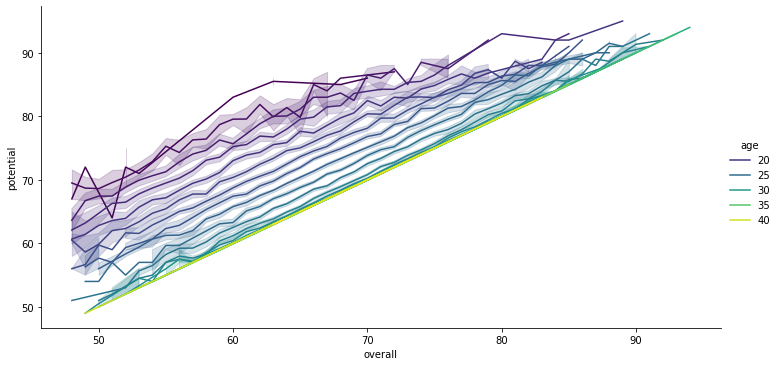

In [39]:
sns.relplot(data = df, x = 'overall', y = 'potential', palette = 'viridis',
            hue='age',aspect=2, kind = 'line');

There is linearly dependant relation between Overall Rating and Potential, we can see that the younger players have the highest potential.

### Question 17 :
##### Correlation between features.

#### Code :

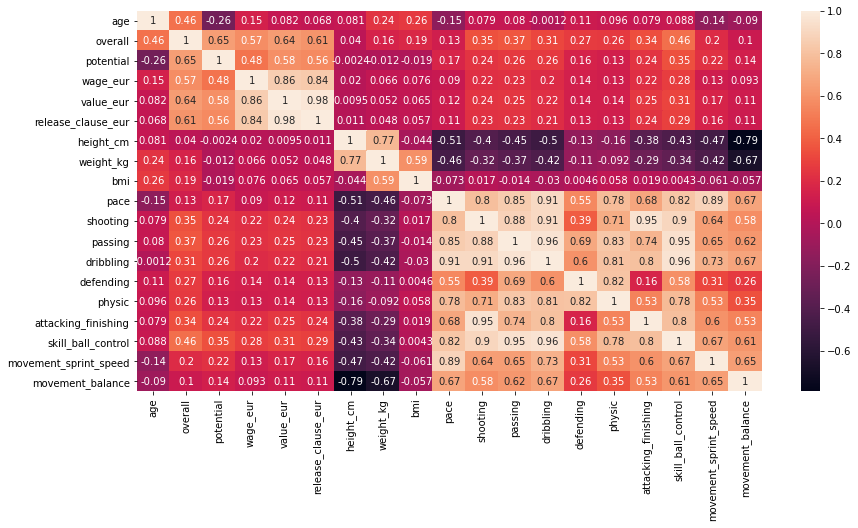

In [40]:
# Give size for the graph
plt.figure(figsize=(14, 7))

# Show the correlation between columns by plotting heatmap
df_heat=df[['age','overall','potential','wage_eur','value_eur','release_clause_eur','height_cm','weight_kg','bmi','pace', 'shooting',
            'passing', 'dribbling', 'defending', 'physic', 
       'attacking_finishing',
       'skill_ball_control', 'movement_sprint_speed', 'movement_balance']]
# Use seaborn package to plot heatmap
sns.heatmap(df_heat.corr(),  annot=True);

- Heatmap display that there is high correlation between:
wage and value, release clause and value, release cause and age.
- positive correlation between:
overall and potentail, weight and height, defending and physical.
- positive correlation between:
sprint speed and movement balance, sprint speed and ball control, sprint speed and pace.
- the positive coorelation between: 
shooting and dribbling, shooting and attacking finishing.

### Talk about some of the relationships you observed in this part of the investigation. Were there features that strengthened each other in terms of looking at your feature(s) of interest?
- Overall rating & Value and age, players with highest overall rating are valued more based on age group 25-30.
- Overall rating & potential and age, There is linearly dependant relation between Overall Rating and Potential, we can see that the younger players have the highest potential.

### Question 18 :
##### Comparison between (MESSI VS RONALDO).

#### Code :

In [41]:
# Show some skills for Messi and Ronaldo
df2=df[['short_name','overall','potential','pace','shooting','passing','dribbling','defending','physic']]
rival = df2.head(2)
rival= rival.set_index('short_name')
rival.head()

,overall,potential,pace,shooting,passing,dribbling,defending,physic
short_name,,,,,,,,
L. Messi,94,94,87.0,92.0,92.0,96.0,39.0,66.0
Cristiano Ronaldo,93,93,90.0,93.0,82.0,89.0,35.0,78.0


In [42]:
# Finding the row values of Messi
values = rival.iloc[0].tolist()
values += values [:1]

# Finding the row values of Ronaldo
values2 = rival.iloc[1].tolist()
values2 += values2[:1]


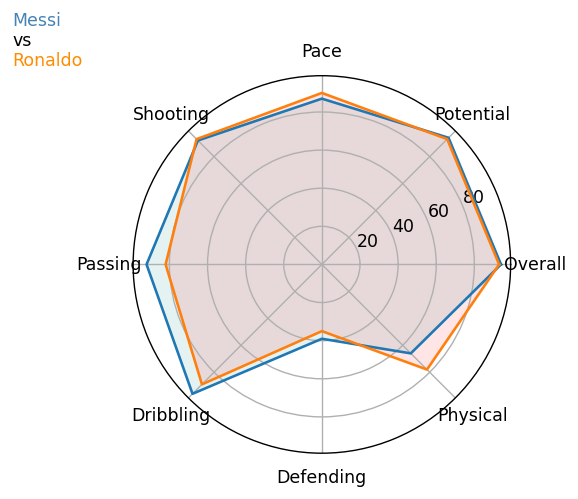

In [43]:
# Plottin RadarChart to display the differance between messi and Ronaldo
def RadarChart(player, data, player2, data2):
    Attributes = ["Overall","Potential","Pace","Shooting","Passing","Dribbling","Defending","Physical"]

    data += data [:1]
    data2 += data2 [:1]
    
    angles = [n / 8 * 2 * pi for n in range(8)]
    angles += angles [:1]
    
    angles2 = [n / 8 * 2 * pi for n in range(8)]
    angles2 += angles2 [:1]
    plt.figure(dpi=125)
    ax = plt.subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    
    plt.xticks(angles[:-1],Attributes)

    ax.plot(angles,values)
    ax.fill(angles, values, 'teal', alpha=0.1)

    ax.plot(angles2,values2)
    ax.fill(angles2, values2, 'red', alpha=0.1)

    plt.figtext(0.1,0.98,player,color="steelblue")
    plt.figtext(0.1,0.94,"vs")
    plt.figtext(0.1,0.9,player2,color="darkorange")
    
    
RadarChart("Messi",[94.0, 94.0, 87.0, 92.0, 92.0, 96.0, 39.0, 66.0, 94.0],"Ronaldo",[93.0, 93.0, 90.0, 93.0, 82.0, 89.0, 35.0, 78.0, 93.0]);

- RadarChart display that Messi is better than Ronaldo in dribbling & passing & overall & defending & potential.
- Ronaldo is better than Messi in physical & shooting & pace. 

### Question 19 :
##### Comparison between (MESSI VS M. Salah).

#### Code :

In [44]:
# Show some skills for Messi and M.Salah
df2=df[['short_name','overall','potential','pace','shooting','passing','dribbling','defending','physic']]
rival = df2.head(10)
rival= rival.set_index('short_name')
rival.head(10)

,overall,potential,pace,shooting,passing,dribbling,defending,physic
short_name,,,,,,,,
L. Messi,94,94,87.0,92.0,92.0,96.0,39.0,66.0
Cristiano Ronaldo,93,93,90.0,93.0,82.0,89.0,35.0,78.0
Neymar Jr,92,92,91.0,85.0,87.0,95.0,32.0,58.0
J. Oblak,91,93,0.0,0.0,0.0,0.0,0.0,0.0
E. Hazard,91,91,91.0,83.0,86.0,94.0,35.0,66.0
K. De Bruyne,91,91,76.0,86.0,92.0,86.0,61.0,78.0
M. ter Stegen,90,93,0.0,0.0,0.0,0.0,0.0,0.0
V. van Dijk,90,91,77.0,60.0,70.0,71.0,90.0,86.0
L. Modrić,90,90,74.0,76.0,89.0,89.0,72.0,66.0


In [45]:
# Finding the row values of Messi
values1 = rival.iloc[0].tolist()
values1 += values [:1]

# Finding the row values of M. salah
values3 = rival.iloc[-1].tolist()
values3 += values2[:1]

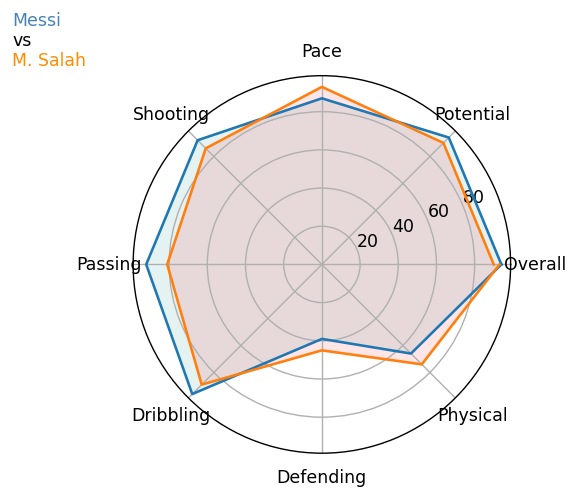

In [46]:
# Plottin RadarChart to display the differance between messi and M. Salah
def RadarChart(player, data, player2, data2):
    Attributes = ["Overall","Potential","Pace","Shooting","Passing","Dribbling","Defending","Physical"]

    data += data [:1]
    data2 += data2 [:1]
    
    angles = [n / 8 * 2 * pi for n in range(8)]
    angles += angles [:1]
    
    angles2 = [n / 8 * 2 * pi for n in range(8)]
    angles2 += angles2 [:1]
    plt.figure(dpi=125)
    ax = plt.subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    
    plt.xticks(angles[:-1],Attributes)

    ax.plot(angles,values1)
    ax.fill(angles, values1, 'teal', alpha=0.1)

    ax.plot(angles2,values3)
    ax.fill(angles2, values3, 'red', alpha=0.1)

    plt.figtext(0.1,0.98,player,color="steelblue")
    plt.figtext(0.1,0.94,"vs")
    plt.figtext(0.1,0.9,player2,color="darkorange")
    
    
RadarChart("Messi",[94.0, 94.0, 87.0, 92.0, 92.0, 96.0, 39.0, 66.0, 94.0],"M. Salah",[90.0, 90.0, 93.0, 86.0, 81.0, 89.0, 45.0, 74.0, 93.0]);

- RadarChart display that M.Salah is better than Messi in defending & physical & pace.
- Messi is better than M.Salah in dribbling & passing & overall & shooting & potential.

### Question 21 :
##### Comparison between (Ronaldo VS M. Salah).

In [47]:
# Finding the row values of M.Salah
values7 = rival.iloc[-1].tolist()
values7 += values [:1]

# Finding the row values of Ronaldo
values8 = rival.iloc[1].tolist()
values8 += values2[:1]

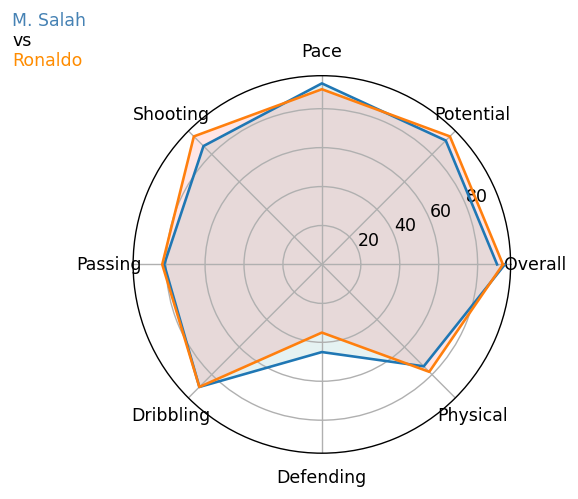

In [48]:
# Plottin RadarChart to display the differance between messi and Ronaldo
def RadarChart(player, data, player2, data2):
    Attributes = ["Overall","Potential","Pace","Shooting","Passing","Dribbling","Defending","Physical"]

    data += data [:1]
    data2 += data2 [:1]
    
    angles = [n / 8 * 2 * pi for n in range(8)]
    angles += angles [:1]
    
    angles2 = [n / 8 * 2 * pi for n in range(8)]
    angles2 += angles2 [:1]
    plt.figure(dpi=125)
    ax = plt.subplot(111, polar=True)
    ax = plt.subplot(111, polar=True)
    
    plt.xticks(angles[:-1],Attributes)

    ax.plot(angles,values7)
    ax.fill(angles, values7, 'teal', alpha=0.1)

    ax.plot(angles2,values8)
    ax.fill(angles2, values8, 'red', alpha=0.1)

    plt.figtext(0.1,0.98,player,color="steelblue")
    plt.figtext(0.1,0.94,"vs")
    plt.figtext(0.1,0.9,player2,color="darkorange")
    
    
RadarChart("M. Salah",[90.0, 90.0, 93.0, 86.0, 81.0, 89.0, 45.0, 74.0, 93.0],"Ronaldo",[93.0, 93.0, 90.0, 93.0, 82.0, 89.0, 35.0, 78.0, 93.0]);

- RadarChart display that M.Salah is better than Ronaldo in defending & pace.
- Ronaldo is better than M.Salah in passing & overall & shooting & potential & physical .
- The same in dribbling .

## Hypothesis Test

 We have two different playing foots( Left foot and Right foot) and would like to show if preferred foot has impact on overall rating and attacking finishing or not.

##### Overall Rating
- Null hypothesis : mean of overall rating for Right foot >= mean of overall rating for Left foot.
- Alternative hypothesis : mean of overall rating for Right foot < mean of overall rating for Left foot.

#### Code :

In [105]:
from scipy import stats

# Select overall , attacking finishing for preferred foot
a = df[df['preferred_foot'] == 'Left'][['overall', 'attacking_finishing']]
b = df[df['preferred_foot'] == 'Right'][['overall', 'attacking_finishing']]


print("Length of samples",len(a), len(b))
print("mean of overall rating and attacking_finishing for Left foot",a.mean(),
      "mean of overall rating and attacking_finishing for Right foot", b.mean())


Length of samples 4318 13960
mean of overall rating and attacking_finishing for Left foot overall                66.675776
attacking_finishing    46.922186
dtype: float64 mean of overall rating and attacking_finishing for Right foot overall                66.111748
attacking_finishing    45.178223
dtype: float64


In [103]:
# Take a equal samples from two overall data
new_a = a['overall'].sample(n=30)
new_b = a['overall'].sample(n=30)

# Calculate T-test , P-value for two samples
t , p = stats.ttest_ind(new_a, new_b, equal_var=False)
print("t = " + str(t))
print("p = " + str(p))

t = 0.0957031863709998
p = 0.9240929878306035


- The t-test and p-value computations from the test statistic suggests that there is no significant difference in the preferred foot.
- the t-test means the test statistic is very close to the null hypothesis,and p-value means that there is no statistical significance and fail to reject the null.
- Preferred foot doesn't have a significant impact on the overall score.

##### Attacking Finishing

- Null hypothesis : mean of attacking finishing for Right foot >= mean of attacking finishing for Left foot.
- Alternative hypothesis : mean of attacking finishing for Right foot < mean of attacking finishing for Left foot.


#### Code :

In [104]:
# Take a equal samples from two attacking finishing data
att_a = a['attacking_finishing'].sample(n=30)
att_b = a['attacking_finishing'].sample(n=30)

# Calculate T-test , P-value for two samples
t1, p1 = stats.ttest_ind(att_a,att_b, equal_var= False)
print("t = " + str(t1))
print("p = " + str(p1))

t = -1.4898245743934588
p = 0.14168895199770298


- The t-test and p-value computations from the test statistic suggests that there is significant difference in the preferred foot.
- the t-test means the test statistic is very close to the Alternative hypothesis,and p-value means that there no statistical significance and reject the null hypothesis.
- Preferred foot have a significant impact on the attacking finishing.

## Models for predict players based on Premier League Clubs in FIFA 20

First select important feature to help us in prediction.

#### Code :

In [52]:
df1 = df[['club', 'overall','age', 'potential', 'value_eur', 'wage_eur', 'skill_moves', 'weak_foot','attacking_finishing','movement_sprint_speed','bmi']]


Then select clubs based on Premier League.

#### Code :

In [53]:
df_clubs = df1[(df.club =='Manchester City') |
               (df.club =='Liverpool') |
               (df.club =='Chelsea') |
               (df.club =='Manchester United') |
               (df.club =='Arsenal') |
               (df.club =='Leeds United') |
               (df.club =='Everton') |
               (df.club =='Aston Villa') |
               (df.club =='Newcastle United') |
               (df.club =='Wolverhampton Wanderers') |
               (df.club == 'Tottenham Hotspur') |
              (df.club =='Leiceter City') |
               (df.club =='West Ham United') |
               (df.club =='Burnley') |
                  (df.club =='Southampton') |
               (df.club == 'Crystal Palace') |
              (df.club == 'Brighton & Hove Albion') |
               (df.club == 'West Bromwich Albion') |
               (df.club == 'Fulham') |
               (df.club == 'Sheffield United')]

Replacing them with their ranking in the Premier League.

#### Code :

In [54]:
df_clubs.club = df_clubs.club.replace({'Manchester City':'Top 6',
                                       'Manchester United': 'Top 6' ,
                                       'Liverpool':'Top 6',
                                       'Chelsea':'Top 6',
                                       'West Ham United':'Top 6',
                                       'Leiceter City':'Top 6',
                                       'Tottenham Hotspur':'Mid 11',
                                       'Arsenal':'Mid 11',
                                       'Leeds United':'Mid 11',
                                       'Everton':'Mid 11',
                                       'Aston Villa':'Mid 11',
                                       'Newcastle United':'Mid 11',
                                       'Wolverhampton Wanderers':'Mid 11',
                                       'Crystal Palace':'Mid 11',
                                       'Southampton':'Mid 11',
                                       'Brighton & Hove Albion':'Mid 11',
                                       'Burnley':'Mid 11',
                                       'Fulham':'Bot 3',
                                       'West Bromwich Albion':'Bot 3',
                                       'Sheffield United':'Bot 3'})

See count of clubs in Premier League.

#### Code :

In [55]:
df_clubs.club.value_counts()

Mid 11    360
Top 6     165
Bot 3      93
Name: club, dtype: int64

Check the change

#### Code :

In [56]:
df_clubs

,club,overall,age,potential,value_eur,wage_eur,skill_moves,weak_foot,attacking_finishing,movement_sprint_speed,bmi
5,Top 6,91,28,91,90000000,370000,4,5,82,76,21.0
7,Top 6,90,27,91,78000000,200000,2,3,52,79,24.0
9,Top 6,90,27,90,80500000,240000,4,3,90,92,23.0
12,Mid 11,89,25,91,83000000,220000,3,4,94,72,25.0
13,Top 6,89,26,91,58000000,155000,1,3,13,47,24.0
...,...,...,...,...,...,...,...,...,...,...,...
17585,Mid 11,53,18,76,130000,3000,2,3,36,62,21.0
17645,Mid 11,53,20,69,130000,5000,3,3,49,63,21.0
17655,Mid 11,53,19,68,110000,2000,1,2,9,37,23.0
17852,Mid 11,52,19,67,110000,4000,2,3,28,62,21.0


In [57]:
df_clubs.shape

(618, 11)

####  Overall vs Premier League Clubs

#### Code :

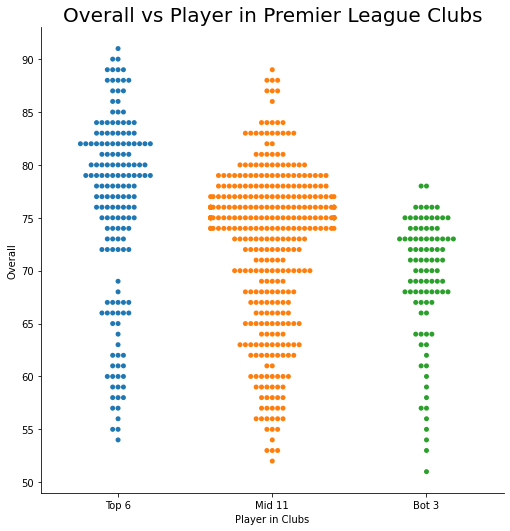

In [107]:
# USe seaborn package to plot scatter plot
ax = sns.catplot( data= df_clubs, x='club', y ='overall', kind= 'swarm',size=7);

# Edit title , x label and y label
plt.title(label='Overall vs Player in Premier League Clubs', fontsize=20);
plt.xlabel(xlabel='Player in Clubs');
plt.ylabel(ylabel='Overall');

- Scatter plot display the overall rating for each ranking in Premier League.
- Top 6 clubs have maximum overall rating over 90 and minimum overall rating 54.
- Bot 3 clubs have maximum overall rating over 73 and minimum overall rating 51.

#### Wage vs Player in Premier League Clubs

#### Code :

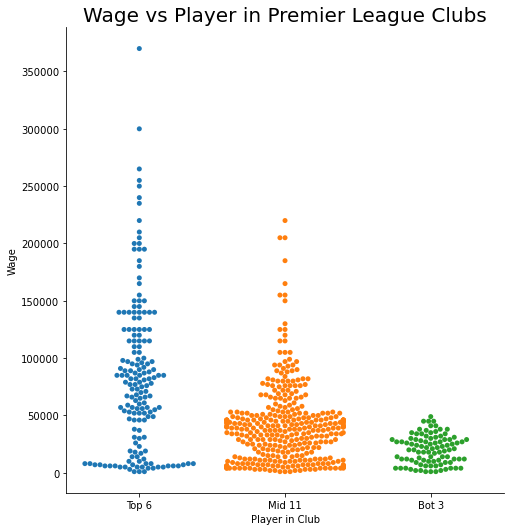

In [108]:
# USe seaborn package to plot scatter plot
ax = sns.catplot( data= df_clubs, x='club', y ='wage_eur', kind= 'swarm',size=7);

# Edit title , x label and y label
plt.title(label='Wage vs Player in Premier League Clubs', fontsize=20);
plt.xlabel(xlabel='Player in Club');
plt.ylabel(ylabel='Wage');

- This graph show relation between players in Clubs and wage of player we show in this graph Top6 Clubs have more Wage to player unlike Mid 11 or Bot 3 that clubs don't have money to pay huge Wage for player 

#### Plot Players in Premier League Clubs by Potential and Value

#### Code :

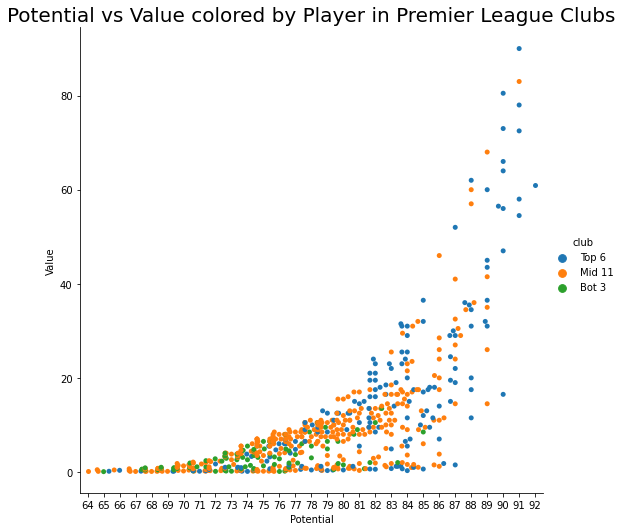

In [109]:

# USe seaborn package to plot scatter plot
value_e=(df_clubs.value_eur)/1000000
ax = sns.catplot( data= df_clubs, x='potential', y =value_e ,hue='club', kind= 'swarm',size=7);

# Edit title , x label and y label
plt.title(label='Potential vs Value colored by Player in Premier League Clubs', fontsize=20);
plt.xlabel(xlabel='Potential');
plt.ylabel(ylabel='Value');


- Scatter plot show players in Bot 3 clubs have potential less than top 6 and mid 11 between 81-85 and not have high value.
- Top 6 clubs have the highest potentianl and value.

## Classifying with Decision Tree

### X - all features except the club , y - clubs

#### Code :

In [61]:
X = df_clubs.iloc[:, 1:].values
y = df_clubs.club.values

### 80/20 train & test split

#### Code :

In [62]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state = 1)

### Standardize data

#### Code :

In [63]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

### Scale both the train and the test set

#### Code :

In [64]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

### Apply Decision Tree

#### Code :

In [65]:
from sklearn.tree import DecisionTreeClassifier

### Initialize the decision tree classifier

#### Code :

In [66]:
dtc = DecisionTreeClassifier()

### Train the model

#### Code :

In [67]:
dtc.fit(X_train, y_train)


DecisionTreeClassifier()

### Get prediction


#### Code :

In [68]:
y_pred = dtc.predict(X_test)

In [69]:
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score

### Confusion matrix

#### Code :

In [70]:
pd.crosstab(y_test, y_pred, rownames=['True'], colnames=['Predicted'], margins=True)


Predicted,Bot 3,Mid 11,Top 6,All
True,,,,
Bot 3,10,9,2,21
Mid 11,10,42,18,70
Top 6,0,10,23,33
All,20,61,43,124


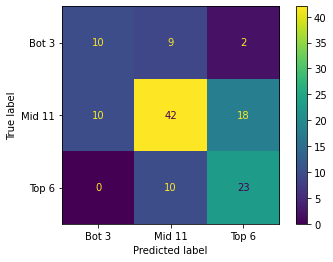

In [71]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(dtc, X_test, y_test);

### Test set accuracy

#### Code :

In [72]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy : " , accuracy)


Accuracy :  0.6048387096774194


## KNN Cluster Model

### Divide data to train and testing


#### Code :

In [73]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(X, y, test_size=0.20, random_state = 1)


### Import library and scalling the data


#### Code :

In [74]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train1 = sc.fit_transform(X_train1)
X_test1 = sc.transform(X_test1)

### Apply KKN Cluster 

#### Code :

In [75]:
from sklearn.neighbors import KNeighborsClassifier
classifier = KNeighborsClassifier(n_neighbors = 5, metric = 'minkowski', p = 3)


### Train the model

#### Code :

In [76]:
classifier.fit(X_train1, y_train1)

KNeighborsClassifier(p=3)

### Get prediction


#### Code :

In [77]:
y_pred1 = classifier.predict(X_test1)


### Confusion matrix

#### Code :

In [78]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test1, y_pred1)
print(cm)

[[ 8 13  0]
 [ 9 52  9]
 [ 1 21 11]]


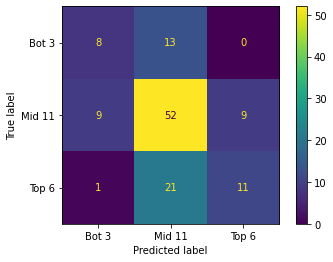

In [79]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(classifier, X_test1, y_test1);

### Test set accuracy

#### Code :

In [80]:
accuracy1=accuracy_score(y_test1, y_pred1)
print('Accuracy :' ,accuracy1 )

Accuracy : 0.5725806451612904


## Support Vector Machine (SVM) Model

### Divide data to train and testing


#### Code :

In [81]:
from sklearn.model_selection import train_test_split
X_train2, X_test2, y_train2, y_test2 = train_test_split(X, y, test_size = 0.25, random_state = 0)

### Import library and scalling the data


#### Code :

In [82]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train2 = sc.fit_transform(X_train2)
X_test2= sc.transform(X_test2)

### Apply SVM 

#### Code :

In [83]:
from sklearn.svm import SVC
classifier = SVC(kernel = 'linear', random_state = 0)


### Train the model

#### Code : 

In [84]:
classifier.fit(X_train2, y_train2)

SVC(kernel='linear', random_state=0)

### Get prediction


#### Code :

In [85]:
y_pred2 = classifier.predict(X_test2)

### Confusion Matrix

#### Code :

In [86]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test2, y_pred2)
print(cm)

[[ 0 26  0]
 [ 0 85 11]
 [ 0 17 16]]


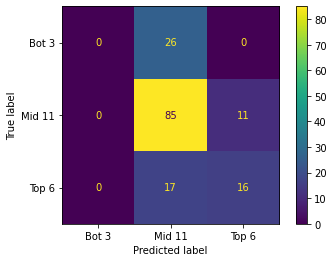

In [87]:
plot_confusion_matrix(classifier, X_test2, y_test2);


### Test set accuracy

#### Code :

In [88]:
accuracy2 =accuracy_score(y_test2, y_pred2)
print('Accuracy :',accuracy2)

Accuracy : 0.6516129032258065


## Random Forest Classifier (RFC) Model


### Divide data to train and testing


#### Code :

In [89]:
from sklearn.model_selection import train_test_split
X_train3, X_test3, y_train3, y_test3 = train_test_split(X, y, test_size = 0.25, random_state = 0)

### Import library and scalling the data


#### Code :

In [90]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train3 = sc.fit_transform(X_train3)
X_test3 = sc.transform(X_test3)

### Apply RFC

#### Code :

In [91]:
from sklearn.ensemble import RandomForestClassifier
classifier = RandomForestClassifier(n_estimators = 10, criterion = 'entropy', random_state = 0)


### Train the model

#### Code :

In [92]:
classifier.fit(X_train3, y_train3)

RandomForestClassifier(criterion='entropy', n_estimators=10, random_state=0)

### Get prediction


#### Code :

In [93]:
y_pred3 = classifier.predict(X_test3)


### Confusion Matrix

#### Code :

In [94]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test3, y_pred3)
print(cm)

[[12 14  0]
 [ 7 75 14]
 [ 0 13 20]]


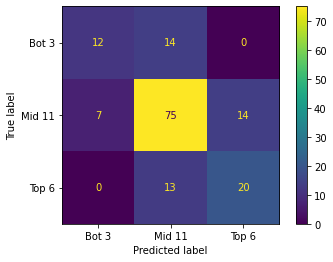

In [95]:
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(classifier, X_test3, y_test3);

### Test set accuracy

#### Code :

In [96]:
accuracy3 =accuracy_score(y_test3, y_pred3)
print('Accuracy :' , accuracy3)

Accuracy : 0.6903225806451613


## Conclusion

After exploration, find that there is high correlation between:
- Wage and value
- release clause and value
- release clause and age
positive correlation between: 
- overall and potentail, weight and height, defending and physical.
- sprint speed and movement balance, sprint speed and ball control, sprint speed and pace.
- shooting and dribbling, shooting and attacking finishing.

The result of exploration
- Distributions for in value_eur wage_eur and release_clause_eur are highly skewed to the right.
- We can say that distribution for overall and potential is normal.
- There are many outliers in value & wage & release clause and pace, Few outliers in overall & weight and height and potential.
-  L.Messi is the most player has high overall & wage & release_clause & attacking_finishing & dribbling & mentality_vision .
- Neymar Jr has high value.
- Cristiano Ronaldo has high power_shot.
- C. Muñoz is the oldest player with 42 years old.
- V. van Dijk has high defending.

- Age doesn't linearly effect overall rating, Maximum of rating first increases and then decreases.
- Height and weight, show that Height and weight are linearly dependant
- Pace and weight, Pace tends to decrease with increase in weight.
- Height and defending, show that the highest defending has the height between 180-190 with few outliers compared to the lowest defending.
- There is no direct relation between BMI and overall, because there are outliers effect on the relation, Maximum of rating increases and then decreases.

- Overall rating & Value and age, players with highest overall rating are valued more based on age group 25-30.
- Overall rating & potential and age, There is linearly dependant relation between Overall Rating and Potential, we can see that the younger players have the highest potential.
- RadarChart display that Messi is better than Ronaldo in dribbling & passing & overall & defending & potential.
- Ronaldo is better than Messi in physical & shooting & pace.
- M.Salah is better than Messi in defending & physical & pace.
- Messi is better than M.Salah in dribbling & passing & overall & shooting & potential.
- M.Salah is better than Ronaldo in defending & pace.
- Ronaldo is better than M.Salah in passing & overall & shooting & potential & physical .

The result of hypothesis test 
- Preferred foot doesn't have a significant impact on the overall score.
- Preferred foot have a significant impact on the attacking finishing.

The result of models
- Random Forest Classifier (RFC) Model has the highest accuracy with 69% ,The next is Support Vector Machine (SVM) with accuracy 65%, and Decision Tree with accuracy 60% ,and KKN Cluster with accuracy 57%.


## Limitations of data

- The market value of the clubs.
- Classes of teams in each league